In [1]:
from maelzel.partialtracking.spectrum import Spectrum
import sndfileio
from maelzel.snd.audiosample import Sample
from maelzel.partialtracking import plotting
from maelzel import histogram
from pitchtools import *
import matplotlib.pyplot as plt
import numpy as np
from maelzel.partialtracking import pack

%matplotlib inline


In [2]:
samples, info = sndfileio.sndget("../snd/CountDownFrom10-M.flac")


In [3]:
samples1 = samples[:, 0].copy() if info.channels == 2 else samples
sp = Spectrum.analyze(samples1, sr=info.samplerate, resolution=60, windowsize=80, freqdrift=40)
sp = Spectrum([p for p in sp if len(p) >= 2])
sp

Spectrum(numpartials=7062, start=0.006, end=11.369, density=4163.9)

We use .synthesize instead of .play because we want the sound to be embedded in the notebook

Sample(dur=68.21172335600907, sr=44100, ch=1)
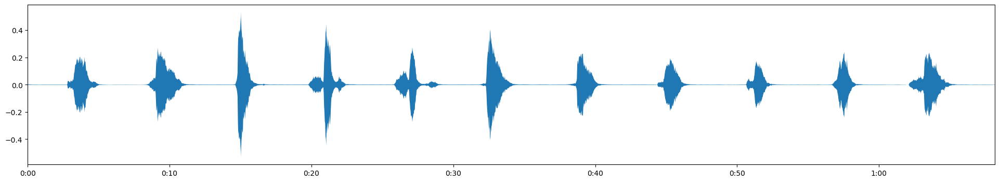

In [4]:
sp.timeScale(6).synthesize()

Spectrum(numpartials=535, start=0.542, end=11.367, density=827.2) Spectrum(numpartials=6527, start=0.007, end=11.369, density=3376.2)


Sample(dur=11.367120181405896, sr=44100, ch=1)
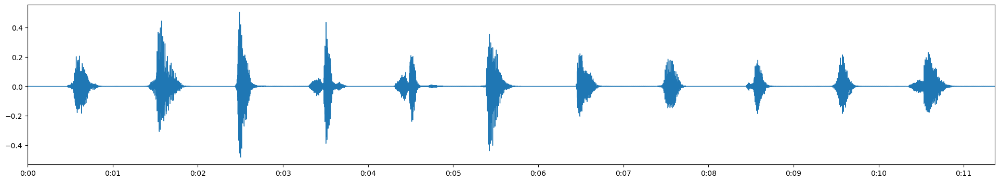

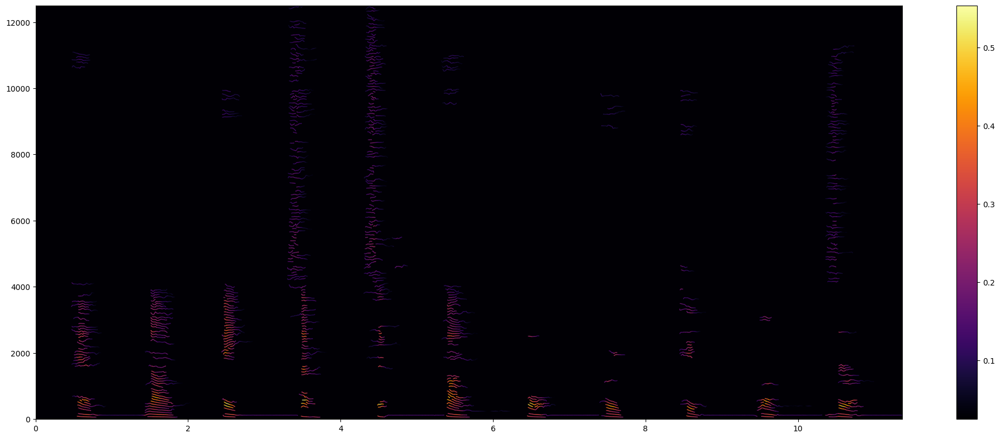

In [28]:
spA, spB = sp.filter(minpercentile=0.15, numbands=10, banddistribution=0.6)
spA.plot(exp=0.3)
print(spA, spB)
spA.synthesize()


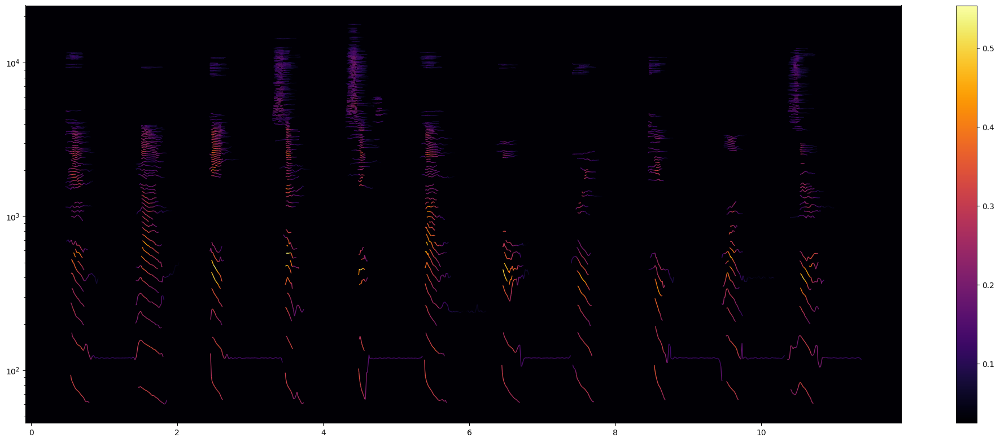

In [8]:
spA.plot(exp=0.3, scale='log')

In [29]:
timescale = 8
maxtransient = 0.2
voiced, residual = sp.filter(minpercentile=0.15, numbands=10, banddistribution=0.6)

voiced2 = voiced.timeScale(timescale)
# Apply a different stretch to transients, keeping the alignment with the voiced partials
residual2 = Spectrum([p for p in residual if p.duration < maxtransient and p.meanbw() > 0]).timeScaleOffsets(timescale, itemfactor=2)
spmix = Spectrum(voiced2.partials + residual2.partials)
spmix

Spectrum(numpartials=6180, start=3.742, end=90.937, density=451.2)

Sample(dur=90.93698412698413, sr=44100, ch=1)
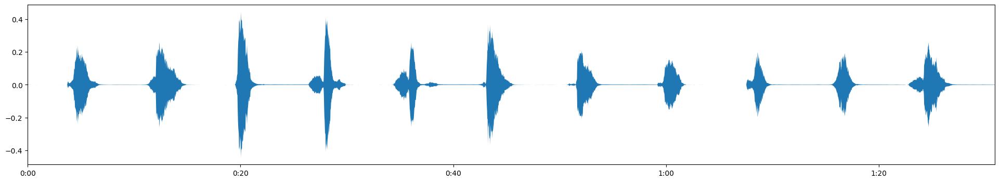

In [30]:
spmix.synthesize()

In [4]:
sp2 = Spectrum([p for p in sp.partials if len(p) > 2 and p.duration > 0.02 and p.meanfreq() < 12000])
print(f"Len sp2: {len(sp2)}, higher than 4000 hz: {len([p for p in sp2 if p.meanfreq() > 4000])}")
sp2

Len sp2: 3789, higher than 4000 hz: 1983


Spectrum(numpartials=3789, start=0.006, end=11.367, density=3066.1)

342, partials with freq > 3000: 0, audibility: 0.26904
Noise partials: 69


Sample(dur=11.367120181405896, sr=44100, ch=1)
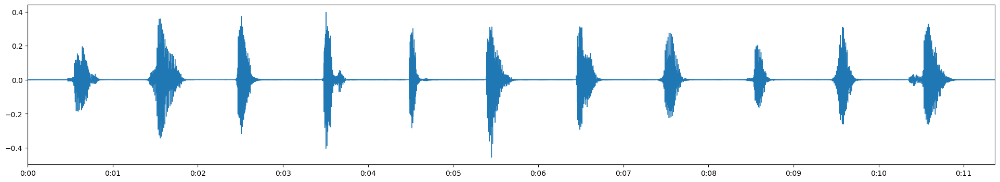

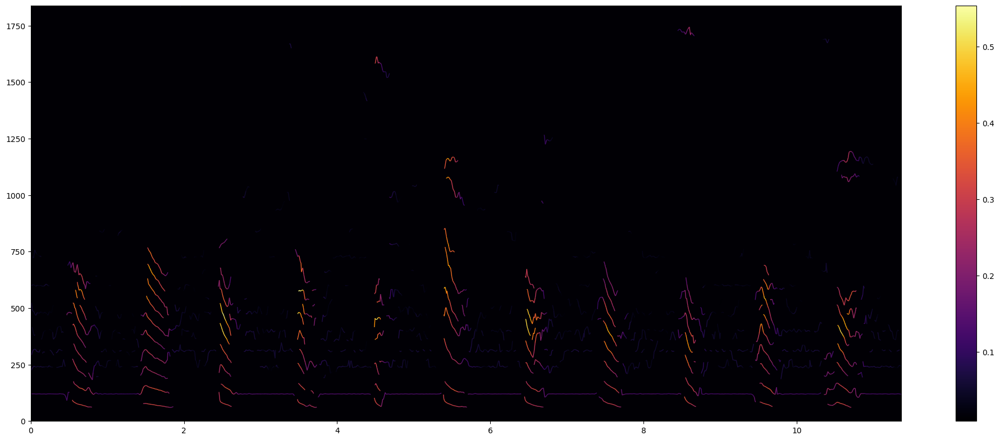

In [13]:
out = sp2.splitInTracks(maxtracks=10, distribution=None, noisetracks=3, noisefreq=2000, noisebw=0.2, relerror=0.1)
tracks = out.tracks
# noisetracks = out.noisetracks
# residual = out.residual
voicedspectrum = Spectrum(sum([track.partials for track in tracks], start=[]))
noisesp = Spectrum(sum([track.partials for track in out.noisetracks], start=[]))

print(f"{len(voicedspectrum)}, partials with freq > 3000: {sum(1 for p in voicedspectrum if p.meanfreq() > 3000)}, audibility: {sum(p.audibility() for p in voicedspectrum):.5g}")
print(f"Noise partials: {len(noisesp)}") 
voicedspectrum.plot(exp=0.3)
voicedspectrum.synthesize(gain=1.5)


69 8


Button(description='Stop', style=ButtonStyle())

Output()

Synth(𝍪 .playPartials=501.0004 start=153.808 dur=-1.000 p4=105 ifn=0 iskip=1412 inumrows=10 inumcols=1 kspeed=0 kloop=0 kminfreq=0 kmaxfreq=6 iflags=0 istart=0 istop=1 kfreqscale=1 ichan=1 kbwscale=1 kgain=0 iposition=0 kfreqoffset=0 kminbw=1 kmaxbw=0)

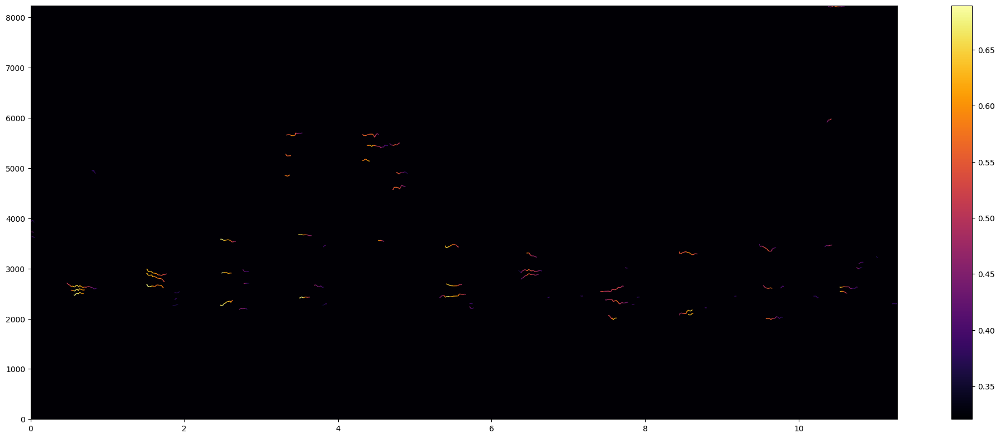

In [14]:
print(len(noisesp), sum(1 for p in noisesp if p.meanfreq() > 5000))
noisesp.plot(exp=0.1)
noisesp.play()

Num partials: 411


Button(description='Stop', style=ButtonStyle())

Output()

Synth(𝍪 .playPartials=501.001 start=265.055 dur=-1.000 p4=106 ifn=0 iskip=1372 inumrows=40 inumcols=1 kspeed=0 kloop=0 kminfreq=0 kmaxfreq=6 iflags=0 istart=0 istop=1 kfreqscale=1 ichan=1 kbwscale=1 kgain=0 iposition=0 kfreqoffset=0 kminbw=1 kmaxbw=0)

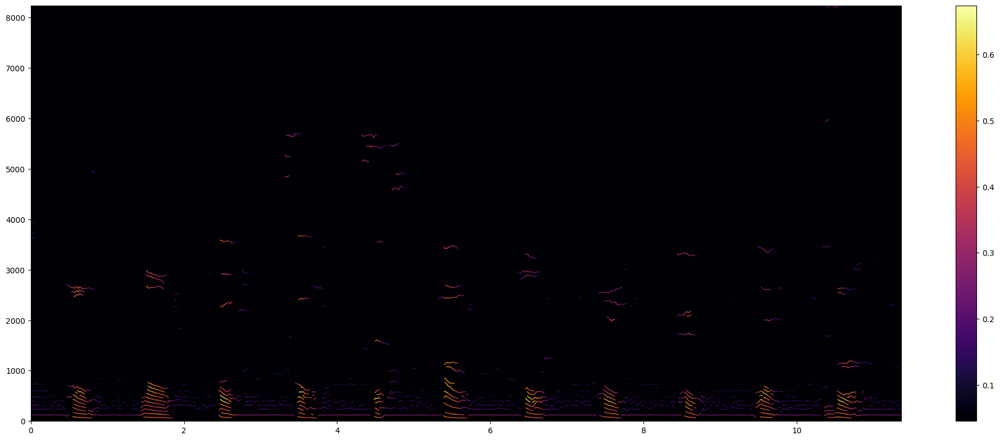

In [21]:
sp3 = Spectrum(voicedspectrum.partials + noisesp.partials)
print(f"Num partials: {len(sp3.partials)}")
sp3.plot(exp=0.2)
sp3.play()

In [12]:
tracks, residualtracks, residual = sp2.splitInTracks(8, maxresidual=4, relerror=0.001, numbands=3, distribution=0.8, maxrange=12*4, ampcurveIncidence=1., mingap=0.01, residualMinFreq=3500)
tracks

NameError: name 'sp2' is not defined

In [27]:
partials = sum(tracks, start=[])
partials.extend(sum(residualtracks, start=[]))
sp2sum = Spectrum(partials)
print(len(sp2sum), len([p for p in sp2sum if p.meanfreq() > 2500]))
sp2sum


57 5


Spectrum(numpartials=57, start=0.317, end=10.724)

In [12]:
sp2sum.plot()
sp2sum.play()

Button(description='Stop', style=ButtonStyle())

Output()

skip: 0, numcols: 43, numrows: 942, idt: 0.011400 


Synth(▶ .playPartials:501.0003, p4=0 ifn:5=104 iskip:6=0 inumrows:7=942 inumcols:8=43 kspeed:9=1 kloop:10=0 kminfreq:11=0 kmaxfreq:12=0 iflags:13=6 istart:14=0 istop:15=0 kfreqscale:16=1 ichan:17=1)

In [51]:
residualsp = Spectrum(sum(residualtracks, start=[]))
residualsp.plot()

In [17]:
residualsp = Spectrum(residual)
residualsp

Spectrum(numpartials=3578, start=0.014, end=10.726)

In [16]:
residualsp.play()
residualsp.plot()

skip: 0, numcols: 475, numrows: 1471, idt: 0.007300 


In [24]:
[p for p in sp2sum if p.meanfreq() > 1000]

[Partial(numbreakpoints=39, start=5.2924, end=5.9032, meanfreq=1029.1, meanamp=-42.4dB,
 Partial(numbreakpoints=19, start=5.4490, end=5.7208, meanfreq=1133.2, meanamp=-37.3dB,
 Partial(numbreakpoints=19, start=8.2646, end=8.5368, meanfreq=1357.4, meanamp=-36.5dB,
 Partial(numbreakpoints=19, start=8.2650, end=8.5359, meanfreq=1145.8, meanamp=-33.7dB,
 Partial(numbreakpoints=22, start=8.2655, end=8.5888, meanfreq=1249.9, meanamp=-39.2dB]

In [9]:
energy = [p.energy() for p in sp2]
freq = [p.meanfreq() for p in sp2]
histogram.dependentHistogram(energy, freq, numbins=5, distribution=0.25)

[55.28872389134877,
 570.0792000398044,
 728.0708097873248,
 1137.4677214639146,
 3028.5946465120896,
 11999.592592029492]

In [60]:
counts, edges = np.histogram(freqenergy, bins=5)
print(edges)
print(edges*maxfreq)

[0.00514228 0.20414561 0.40314894 0.60215227 0.8011556  1.00015893]
[   61.70528027  2449.66417356  4837.62306685  7225.58196014
  9613.54085343 12001.49974672]


In [58]:
0.005142 * maxfreq 

61.70190510821565

In [24]:
H, x, y = np.histogram2d(energy, freq, bins=10)

In [27]:
plt.imshow(H, interpolation='nearest', origin='lower') # , extent=[x[0], x[-1], y[0],y[-1]])


In [14]:
min(freq)

55.28872389134877

In [15]:
np.histogram(freq, bins=10)

(array([574, 589, 600, 384, 398, 349, 415, 416, 388, 309]),
 array([   55.28872389,  1249.71911071,  2444.14949752,  3638.57988433,
         4833.01027115,  6027.44065796,  7221.87104477,  8416.30143159,
         9610.7318184 , 10805.16220522, 11999.59259203]))

In [17]:
synth = sp2.play(speed=0.5, freqscale=1, minfreq=1000, maxfreq=4000)
synth

skip: 0, numcols: 463, numrows: 1310, idt: 0.008200 


Button(description='Stop', style=ButtonStyle())

Output()

Synth(▶ .playPartials:501.0014, p4=0 ifn:5=104 iskip:6=0 inumrows:7=1310 inumcols:8=463 kspeed:9=0.5 kloop:10=0 kminfreq:11=1000 kmaxfreq:12=4000 iflags:13=0 istart:14=0 istop:15=0 kfreqscale:16=1 ichan:17=1)

In [18]:
synth.set(kminfreq=100)

In [8]:
synth

Button(description='Stop', style=ButtonStyle())

Output()

Synth(▶ .playPartials:501.0003, p4=0 ifn:5=104 iskip:6=0 inumrows:7=1310 inumcols:8=463 kspeed:9=1 kloop:10=0 kminfreq:11=0 kmaxfreq:12=0 iflags:13=0 istart:14=0 istop:15=0 kfreqscale:16=1 ichan:17=1)

In [7]:
resynth = sp.synthesize()
samp = Sample(resynth, 44100)
samp.play()



--Csound version 6.19 (double samples) Apr 17 2023
[commit: 593ac80dd986b58f24e3d59242243ba6266edda7]
libsndfile-1.2.0
sr = 48000.0, kr = 750.000, ksmps = 64
0dBFS level = 1.0, A4 tuning = 442.0
audio buffered in 1024 sample-frame blocks
reading 8192-byte blks of shorts from adc:Built-in Audio Analogue Stereo: (RAW)
writing 2048 sample blks of 64-bit floats to dac:Built-in Audio Analogue Stereo:
SECTION 1:


Button(description='Stop', style=ButtonStyle())

Output()

Synth(▶ .playSample:501.0002, p4=0 isndtab:5=104 istart:6=0 ifadein:7=0.05 ifadeout:8=0.05 igaingroup:9=0 kchan:10=1 kspeed:11=1 kgain:12=1 kpan:13=-1 ixfade:14=-1)

In [6]:
resynth2 = sp2.synthesize()
samp2 = Sample(resynth2, 44100)
samp2.play()



--Csound version 6.19 (double samples) Apr 17 2023
[commit: 593ac80dd986b58f24e3d59242243ba6266edda7]
libsndfile-1.2.0
sr = 48000.0, kr = 750.000, ksmps = 64
0dBFS level = 1.0, A4 tuning = 442.0
audio buffered in 1024 sample-frame blocks
reading 8192-byte blks of shorts from adc:Built-in Audio Analogue Stereo: (RAW)
writing 2048 sample blks of 64-bit floats to dac:Built-in Audio Analogue Stereo:
SECTION 1:


Button(description='Stop', style=ButtonStyle())

Output()

Synth(▶ .playSample:501.0002, p4=0 isndtab:5=104 istart:6=0 ifadein:7=0.05 ifadeout:8=0.05 igaingroup:9=0 kchan:10=1 kspeed:11=1 kgain:12=1 kpan:13=-1 ixfade:14=-1)

In [6]:
sp3 = Spectrum([p.simplified(freqthreshold=0.5) for p in sp.partials if len(p) >= 2 and p.duration > 0.04 and p.meanfreq() < 4500 and p.meanamp() > db2amp(-55)])
sp3

Spectrum(numpartials=230, start=0.342, end=10.367)

In [8]:
resynth3 = sp3.synthesize()
samp3 = Sample(resynth3, 44100)
samp3.play()



--Csound version 6.19 (double samples) Apr 17 2023
[commit: 593ac80dd986b58f24e3d59242243ba6266edda7]
libsndfile-1.2.0
sr = 48000.0, kr = 750.000, ksmps = 64
0dBFS level = 1.0, A4 tuning = 442.0
audio buffered in 1024 sample-frame blocks
reading 8192-byte blks of shorts from adc:Built-in Audio Analogue Stereo: (RAW)
writing 2048 sample blks of 64-bit floats to dac:Built-in Audio Analogue Stereo:
SECTION 1:


Button(description='Stop', style=ButtonStyle())

Output()

Synth(▶ .playSample:501.0002, p4=0 isndtab:5=104 istart:6=0 ifadein:7=0.05 ifadeout:8=0.05 igaingroup:9=0 kchan:10=1 kspeed:11=1 kgain:12=1 kpan:13=-1 ixfade:14=-1)

In [8]:
sp4, residue = sp.filter(maxfreq=6000, minfreq=40, mindur=0.03, minpercentile=0.02)

In [9]:
sp4, residue

(Spectrum(numpartials=85, start=0.342, end=10.367),
 Spectrum(numpartials=7288, start=0.010, end=10.728))

Sample(dur=10.36673469387755, sr=44100, ch=1)
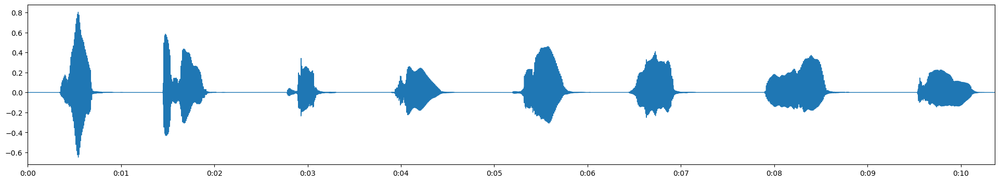

In [10]:
sp4.synthesize()

In [46]:
low, rest = sp.filter(maxfreq=3500)
middle, high = rest.filter(maxfreq=6000)

low2 = low.filter(minpercentile=0.05)[0]
middle2 = middle.filter(minpercentile=0.3)[0]
high2 = high.filter(minpercentile=0.1)[0]

low2, middle2, high2


(Spectrum(numpartials=73, start=0.342, end=10.367),
 Spectrum(numpartials=23, start=0.421, end=9.753),
 Spectrum(numpartials=13, start=0.012, end=10.724))

In [45]:
sp2 = Spectrum(low2.partials+middle2.partials + high2.partials)
sp2

Spectrum(numpartials=108, start=0.342, end=10.724)

In [33]:
sp2.plotmpl()

Sample(dur=10.723922902494332, sr=44100, ch=1)
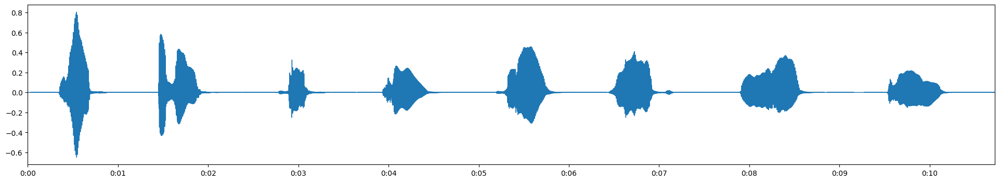

In [43]:
sp2.synthesize()